# MTG -  Basic Lands Classifier
## Results evaluation

In this notebook, we evaluate the performance of our classifier on the validation set. First, we'll compute several evaluation metrics, including accuracy, recall, precision, F1 and ROC AUC scores. We will then explore some predictions, focusing on the cases with the highest confidence, whether they are correct classifications or misclassified cases. Finally, we'll use t-SNE to visualize a 2D representation of the latent space learned by the model.

In [1]:
import altair as alt
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.metrics import auc, classification_report, confusion_matrix, roc_curve
import tensorflow as tf

2022-05-07 21:28:22.585785: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [2]:
# Data directories
root_dir = '../data'
train_dir = os.path.join(root_dir, 'train')
val_dir = os.path.join(root_dir, 'val')

In [3]:
# Load model
model = tf.keras.models.load_model('../model/model.h5')

2022-05-07 21:28:23.352819: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-05-07 21:28:23.417899: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-07 21:28:23.418288: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:08:00.0 name: NVIDIA GeForce RTX 2070 computeCapability: 7.5
coreClock: 1.62GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 417.29GiB/s
2022-05-07 21:28:23.418310: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-05-07 21:28:23.451551: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-05-07 21:28:23.451622: I tensorflow/stream_executor/plat

In [4]:
# Validation data generator with VGG16 preprocessing function
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    preprocessing_function=tf.keras.applications.vgg16.preprocess_input,
)

# Validation dataset - flow from validation directory
val_dataset = val_datagen.flow_from_directory(
    directory=val_dir,
    target_size=(224, 224),
    shuffle=False
)

Found 244 images belonging to 5 classes.


#### Evaluation metrics

In [5]:
# Evaluate
model.evaluate(val_dataset);

2022-05-07 21:28:31.857854: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-05-07 21:28:31.877200: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 3792875000 Hz
2022-05-07 21:28:32.256253: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2022-05-07 21:28:33.656753: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8302
2022-05-07 21:28:34.940595: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-05-07 21:28:34.940635: W tensorflow/stream_executor/gpu/asm_compiler.cc:56] Couldn't invoke ptxas --version
2022-05-07 21:28:34.941165: E tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2022-05-07 21:28:34.941221: W tensorflow/stream_executor/gpu/redzone_allocator.cc:31

8/8 [==============================] - 7s 339ms/step - loss: 0.7994 - accuracy: 0.8033 - top_2_accuracy: 0.9344


In [6]:
# Loop over the generator to get true labels and predictions
y_true, y_pred, y_pred_proba = [], [], []
for i in range(int(np.ceil(val_dataset.n/val_dataset.batch_size))):
    (X, y) = next(val_dataset)
    y_true.append(np.argmax(y, axis=1))
    y_pred.append(np.argmax(model.predict(X), axis=1))
    y_pred_proba.append(model.predict(X))
    
# Flatten the arrays
y_true = [y for arr in y_true for y in arr]
y_pred = [y for arr in y_pred for y in arr]

# Predicted probabilities matrix
y_pred_proba = np.array([y for arr in y_pred_proba for y in arr])

In [7]:
# Labels
labels = list(val_dataset.class_indices.keys())

In [8]:
# Classification report
print('\nClassification Report:\n')
print(classification_report(y_true, y_pred, target_names=labels))


Classification Report:

              precision    recall  f1-score   support

      Forest       0.79      0.76      0.77        49
      Island       0.80      0.92      0.86        49
    Mountain       0.91      0.80      0.85        49
      Plains       0.87      0.84      0.85        49
       Swamp       0.67      0.71      0.69        48

    accuracy                           0.80       244
   macro avg       0.81      0.80      0.80       244
weighted avg       0.81      0.80      0.80       244



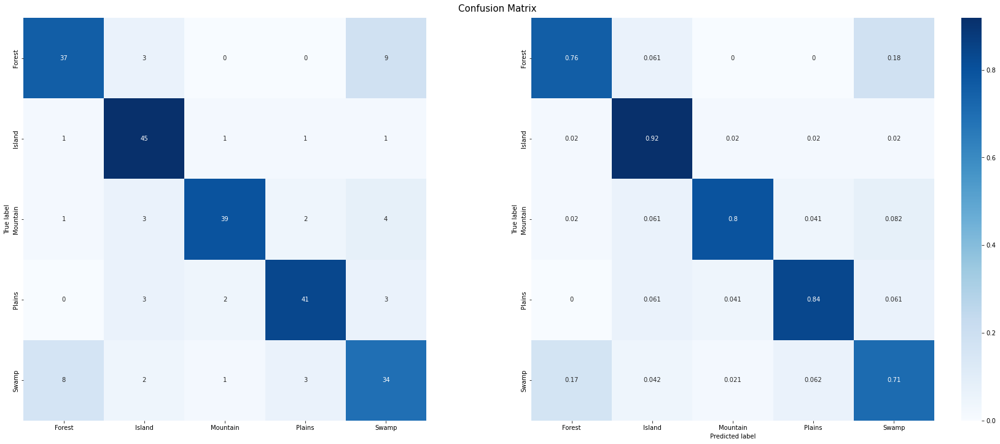

In [9]:
# Confusion matrix
fig, axes = plt.subplots(1, 2, figsize=(25, 10))
fig.suptitle('Confusion Matrix', size=15)
cbar=False
for i, normalize in enumerate([None, 'true']):
    conf_matrix = confusion_matrix(y_true, y_pred, normalize=normalize)
    axes[i] = sns.heatmap(
        conf_matrix,
        cmap='Blues',
        annot=True,
        cbar=cbar,
        square=True,
        xticklabels=labels,
        yticklabels=labels,
        ax=axes[i]
    )
    axes[i].set_ylabel('True label')
    axes[1].set_xlabel('Predicted label')
    cbar=True
fig.tight_layout()

Overall, the model achieves 80% accuracy, as well as macro and weighted average F1 score. The top-2 accuracy is 93%. Island is the class the model manages to predict the best, with 92% recall, 80% precision and 86% F1 score. On the other hand, Swamp is the class that gets the worst evaluation metrics, with 71% recall, 67% precision and 69% F1 score. The most frequent confusions occur between Swamps and Forests.

By treating the problem as five different binary classification tasks, we can analyze the ROC curve and calculate the AUC of each class:

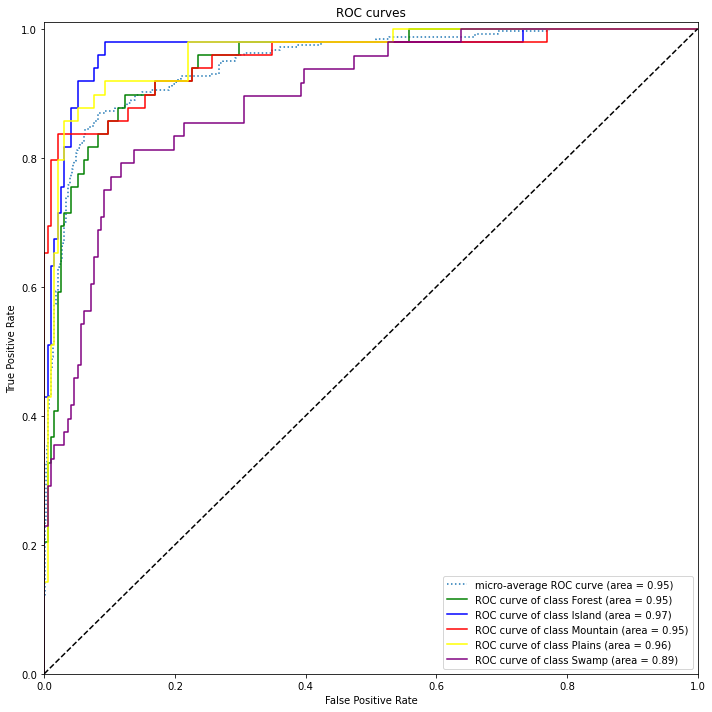

In [10]:
# Binarize labels
y_true_bin = tf.keras.utils.to_categorical(y_true)

# Compute ROC curve and ROC AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(labels)):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC AUC
fpr['micro'], tpr['micro'], _ = roc_curve(y_true_bin.ravel(), y_pred_proba.ravel())
roc_auc['micro'] = auc(fpr['micro'], tpr['micro'])

# Plot ROC curves
plt.figure(figsize=(10, 10))
plt.plot(
    fpr['micro'], tpr['micro'],
    ':',
    label='micro-average ROC curve (area = {0:0.2f})'.format(roc_auc['micro']),
    
)

colors = ['green', 'blue', 'red', 'yellow', 'purple']

for i, color in enumerate(colors):
    plt.plot(
        fpr[i], tpr[i],
        color = color,
        label='ROC curve of class {0} (area = {1:0.2f})'.format(
            labels[i], roc_auc[i]
        )
    )

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.00])
plt.ylim([0.0, 1.01])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC curves')
plt.legend(loc='lower right')
plt.tight_layout();

Most of the AUC values are between 0.95 and 0.97, the only exception being Swamps (0.89). The micro-average ROC AUC score is 0.95, which is a fairly good overall indicator of our model's performance.

#### Explore predictions

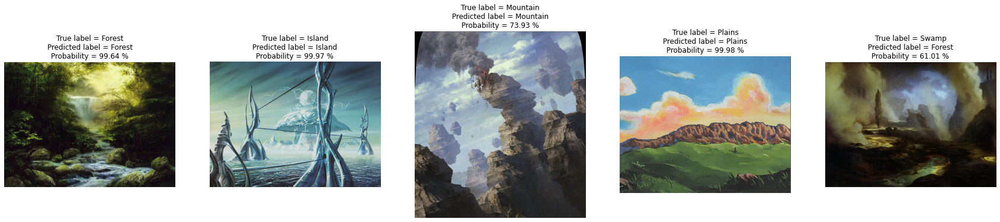

In [11]:
# Inspect some predictions
fig, axes = plt.subplots(1, 5, figsize=(30, 10))
for i, label in enumerate(labels):
    # Select random image
    random_image = np.random.choice(os.listdir(os.path.join(val_dir, label)))
    random_image_file = os.path.join(os.path.join(val_dir, label), random_image)
    
    # Load image
    val_image = tf.keras.preprocessing.image.load_img(random_image_file, target_size=(224, 224))
    
    # Preprocessing
    val_image = tf.keras.preprocessing.image.img_to_array(val_image)
    val_image = tf.keras.applications.vgg16.preprocess_input(val_image)
    val_image = np.expand_dims(val_image, axis=0)

    # Predict
    prediction = model.predict(val_image)
    prediction_probability = np.max(prediction)
    predicted_label = np.argmax(prediction)

    # Plot image and it's prediction
    title = 'True label = {}\nPredicted label = {}\nProbability = {:.2f} %' \
                .format(label, labels[predicted_label], prediction_probability*100)

    axes[i].imshow(plt.imread(random_image_file))
    axes[i].set_title(title)
    axes[i].axis('off')

In [12]:
# Predictions dataframe
preds = pd.DataFrame(data=[val_dataset.filepaths, y_true, y_pred, y_pred_proba]).T
preds.columns = ['filepath', 'y_true', 'y_pred', 'y_pred_proba']
preds['y_pred_proba_max'] = preds['y_pred_proba'].map(max)
preds.sample(5)

,filepath,y_true,y_pred,y_pred_proba,y_pred_proba_max
46,../data/val/Forest/f8f03bb2-313e-4688-945f-052...,0,0,"[0.99939656, 3.782379e-05, 4.948149e-07, 1.705...",0.999397
177,../data/val/Plains/a21333ae-490e-4614-b998-f1a...,3,3,"[0.0010016777, 3.247507e-05, 0.0005390927, 0.6...",0.651466
111,../data/val/Mountain/5353e8b2-3280-48ec-9bc2-8...,2,2,"[2.0623542e-05, 0.0002612858, 0.99864906, 0.00...",0.998649
60,../data/val/Island/24aa9fd2-54d9-40d9-9279-abd...,1,1,"[0.11661218, 0.5116035, 0.045248426, 0.1396747...",0.511603
223,../data/val/Swamp/9eaedaf2-a9a3-44c6-84c1-4cc2...,4,4,"[2.8296918e-05, 0.0011319873, 0.00023882187, 0...",0.997476


In [13]:
# Correct predictions
classified_ok = preds.loc[preds['y_true'] == preds['y_pred']]
classified_ok.sample(5)

,filepath,y_true,y_pred,y_pred_proba,y_pred_proba_max
115,../data/val/Mountain/7352288b-ff7b-43c7-a5ae-3...,2,2,"[1.4490366e-06, 0.00024312502, 0.99973863, 1.5...",0.999739
65,../data/val/Island/36e062ec-df51-40c0-ad8a-2ee...,1,1,"[1.2333118e-12, 1.0, 2.3475981e-09, 5.1751367e...",1.000000
114,../data/val/Mountain/6df2f49d-097e-4685-8ddb-6...,2,2,"[0.00024744758, 0.0012385993, 0.9961337, 0.001...",0.996134
135,../data/val/Mountain/cf940cc3-282e-4b6b-877d-5...,2,2,"[0.0001308401, 0.0005097494, 0.99688476, 0.000...",0.996885
215,../data/val/Swamp/76f8def9-ee46-4abf-9059-7d1e...,4,4,"[0.29804745, 0.05675302, 0.073774375, 0.011061...",0.560363


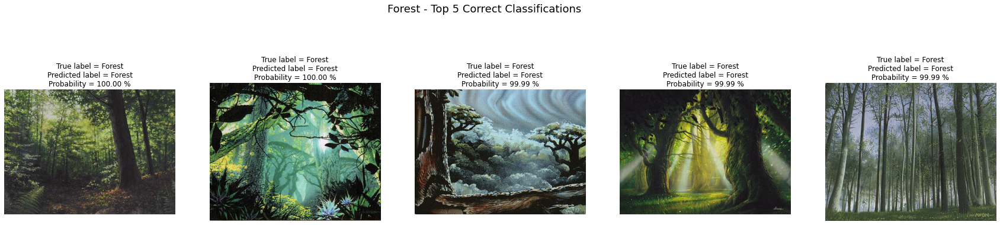

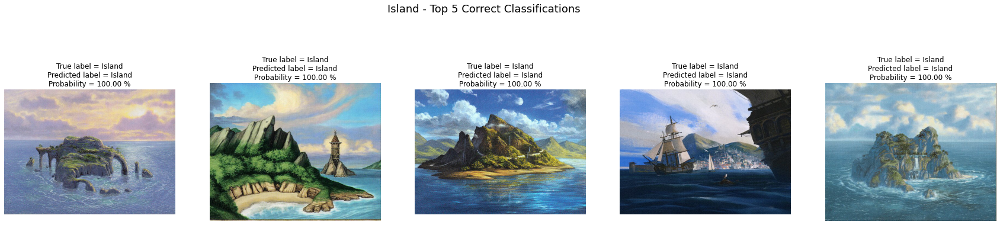

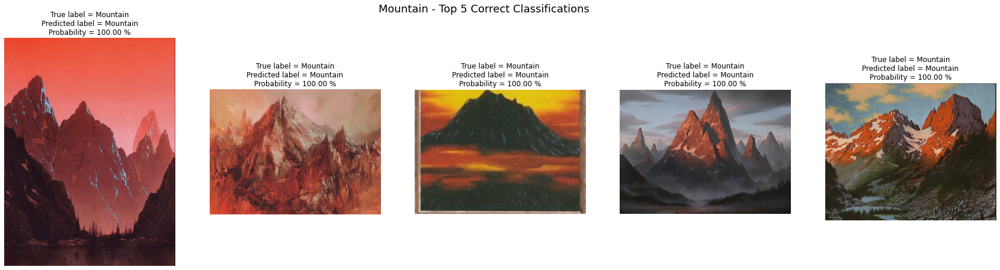

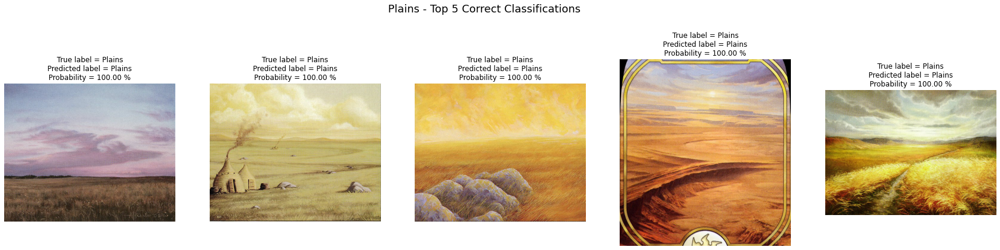

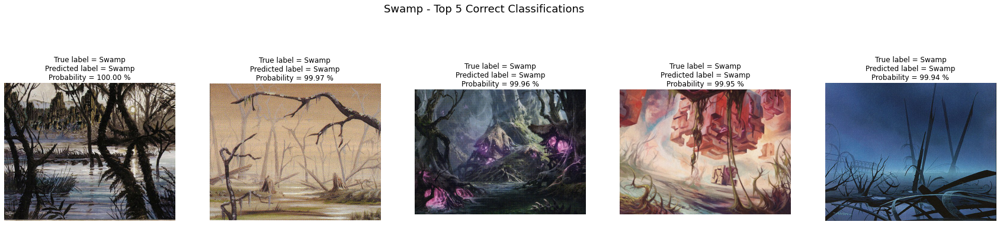

In [14]:
# Filter correct classifications by label and get the top 5 with greatest confidence
for i, label in enumerate(labels):
    fig, axes = plt.subplots(1, 5, figsize=(30, 10))
    
    correct = classified_ok.loc[classified_ok['y_true'] == i].sort_values('y_pred_proba_max', ascending=False).head()
    correct.reset_index(drop=True, inplace=True)
        
    for j, r in correct.iterrows():
        # Plot image and it's prediction
        title = 'True label = {}\nPredicted label = {}\nProbability = {:.2f} %' \
                    .format(label, labels[r['y_pred']], r['y_pred_proba_max']*100)
        axes[j].imshow(plt.imread(r['filepath']))
        axes[j].set_title(title)
        axes[j].axis('off')
        
        fig.suptitle(f"{label} - Top 5 Correct Classifications", size=18, y=0.85)

This is what typical basic lands look like!

In [15]:
# Misclassified cases
misclassified = preds.loc[preds['y_true'] != preds['y_pred']]
misclassified.sample(5)

,filepath,y_true,y_pred,y_pred_proba,y_pred_proba_max
184,../data/val/Plains/d293ea0f-8b87-4d8a-ad8f-650...,3,2,"[0.020630255, 0.021878112, 0.7324451, 0.210555...",0.732445
198,../data/val/Swamp/052bcdff-ee25-4bf2-82a8-ef04...,4,0,"[0.5823367, 0.19669518, 0.10386718, 0.02808710...",0.582337
12,../data/val/Forest/42efdb6a-1c54-497a-9058-af4...,0,4,"[0.34437764, 0.00014352922, 0.0004644605, 0.00...",0.654683
172,../data/val/Plains/8673e184-2b58-44ef-bb68-bd3...,3,4,"[6.0905022e-05, 0.40593615, 0.00043232346, 0.0...",0.593258
31,../data/val/Forest/b606f644-1728-4cb3-90ed-121...,0,4,"[0.038514152, 0.009900671, 0.0018514026, 0.000...",0.949205


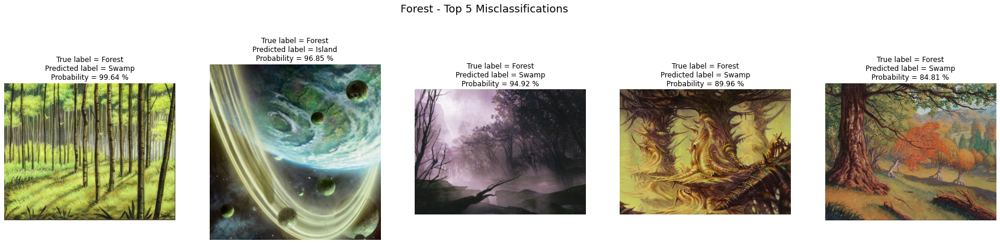

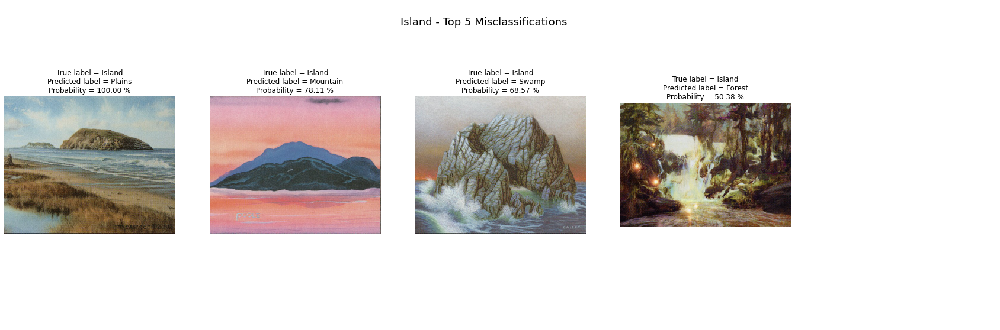

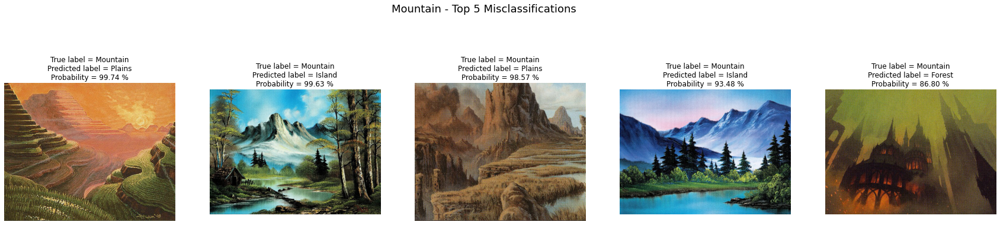

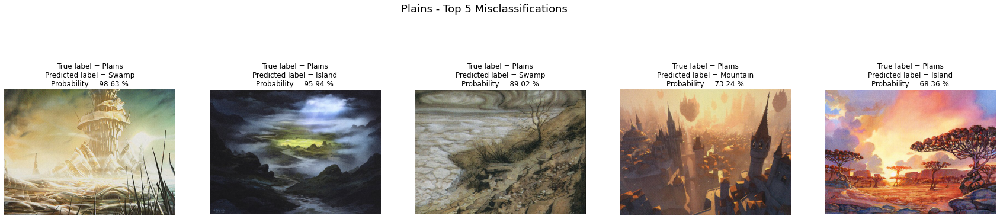

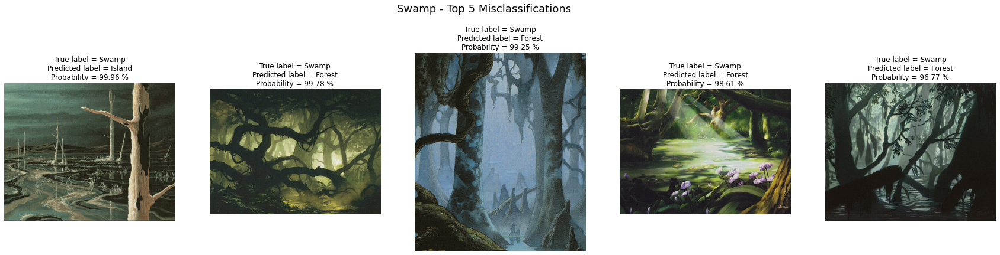

In [16]:
# Filter misclassifications by label and get the top 5 biggest mistakes
for i, label in enumerate(labels):
    fig, axes = plt.subplots(1, 5, figsize=(30, 10))
    
    incorrect = misclassified.loc[misclassified['y_true'] == i].sort_values('y_pred_proba_max', ascending=False).head()
    incorrect.reset_index(drop=True, inplace=True)
    nrows = len(incorrect)
    
    for j, r in incorrect.iterrows():
        # Plot image and it's prediction
        title = 'True label = {}\nPredicted label = {}\nProbability = {:.2f} %' \
                    .format(label, labels[r['y_pred']], r['y_pred_proba_max']*100)
        axes[j].imshow(plt.imread(r['filepath']))
        axes[j].set_title(title)
        axes[j].axis('off')
        
        # Suppress axis of empty subplots, if any
        if nrows < 5:
            for _ in range(nrows, 5):
                axes[_].set_axis_off()
        
        fig.suptitle(f"{label} - Top 5 Misclassifications", size=18, y=0.85)

While some of this mistakes could also be made by humans (specially, some confusions between Forests and Swamps, or between Mountains and Islands), others reveal that there is space for improving our classification model.

Let's explore if the model is capable of generalizing to real-world images of basic lands' landscapes taken from National Geographic media:

In [17]:
# Real forest
!wget -O real_forest.jpg  \
https://media.nationalgeographic.org/assets/photos/111/820/541fc44b-e230-4fab-a429-d26913025a4c.jpg

--2022-05-07 21:29:53--  https://media.nationalgeographic.org/assets/photos/111/820/541fc44b-e230-4fab-a429-d26913025a4c.jpg
Resolving media.nationalgeographic.org (media.nationalgeographic.org)... 13.227.92.119, 13.227.92.129, 13.227.92.24, ...
Connecting to media.nationalgeographic.org (media.nationalgeographic.org)|13.227.92.119|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 623701 (609K) [image/jpeg]
Saving to: ‘real_forest.jpg’

real_forest.jpg     100%[===================>] 609,08K  1,01MB/s    in 0,6s    

2022-05-07 21:29:54 (1,01 MB/s) - ‘real_forest.jpg’ saved [623701/623701]



In [18]:
# Real forest
!wget -O real_island.jpg \
https://media.nationalgeographic.org/assets/photos/000/268/26833.jpg

--2022-05-07 21:29:54--  https://media.nationalgeographic.org/assets/photos/000/268/26833.jpg
Resolving media.nationalgeographic.org (media.nationalgeographic.org)... 13.227.92.94, 13.227.92.24, 13.227.92.129, ...
Connecting to media.nationalgeographic.org (media.nationalgeographic.org)|13.227.92.94|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 132822 (130K) [image/jpeg]
Saving to: ‘real_island.jpg’

real_island.jpg     100%[===================>] 129,71K   378KB/s    in 0,3s    

2022-05-07 21:29:55 (378 KB/s) - ‘real_island.jpg’ saved [132822/132822]



In [19]:
# Real mountain
!wget -O real_mountain.jpg \
https://i.natgeofe.com/n/1ac334a0-ac4e-4745-a292-169b0a349e8b/grand-peaks-mount-cook.jpg

--2022-05-07 21:29:56--  https://i.natgeofe.com/n/1ac334a0-ac4e-4745-a292-169b0a349e8b/grand-peaks-mount-cook.jpg
Resolving i.natgeofe.com (i.natgeofe.com)... 181.30.131.73, 181.30.131.233, 2800:2d20:200a:1::c9d4:202b, ...
Connecting to i.natgeofe.com (i.natgeofe.com)|181.30.131.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1586548 (1,5M) [image/jpeg]
Saving to: ‘real_mountain.jpg’

real_mountain.jpg   100%[===================>]   1,51M  2,08MB/s    in 0,7s    

2022-05-07 21:29:57 (2,08 MB/s) - ‘real_mountain.jpg’ saved [1586548/1586548]



In [20]:
# Real plains
!wget -O real_plains.jpg \
https://media.nationalgeographic.org/assets/photos/000/255/25557.jpg

--2022-05-07 21:29:57--  https://media.nationalgeographic.org/assets/photos/000/255/25557.jpg
Resolving media.nationalgeographic.org (media.nationalgeographic.org)... 13.227.92.94, 13.227.92.24, 13.227.92.129, ...
Connecting to media.nationalgeographic.org (media.nationalgeographic.org)|13.227.92.94|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 115415 (113K) [image/jpeg]
Saving to: ‘real_plains.jpg’

real_plains.jpg     100%[===================>] 112,71K   617KB/s    in 0,2s    

2022-05-07 21:29:58 (617 KB/s) - ‘real_plains.jpg’ saved [115415/115415]



In [21]:
# Real swamp
!wget -O real_swamp.jpg \
https://www.nationalgeographic.com.es/medio/2021/10/19/eternal-triangle_9a4a0ecf_800x400.jpg

--2022-05-07 21:29:58--  https://www.nationalgeographic.com.es/medio/2021/10/19/eternal-triangle_9a4a0ecf_800x400.jpg
Resolving www.nationalgeographic.com.es (www.nationalgeographic.com.es)... 201.212.32.203, 201.212.32.200
Connecting to www.nationalgeographic.com.es (www.nationalgeographic.com.es)|201.212.32.203|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 55601 (54K) [image/jpeg]
Saving to: ‘real_swamp.jpg’

real_swamp.jpg      100%[===================>]  54,30K  94,8KB/s    in 0,6s    

2022-05-07 21:30:00 (94,8 KB/s) - ‘real_swamp.jpg’ saved [55601/55601]



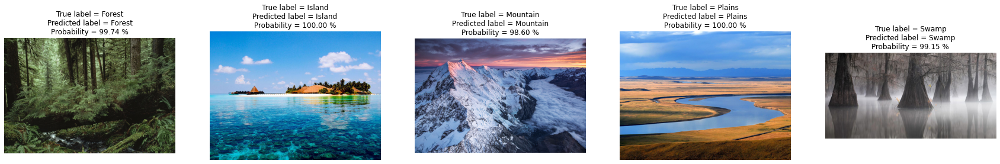

In [22]:
# Inspect predictions on some real-world images
fig, axes = plt.subplots(1, 5, figsize=(30, 10))
for i, label in enumerate(labels):
    real_world_image_file = f"real_{label.lower()}.jpg"
    
    # Load image
    real_world_image = tf.keras.preprocessing.image.load_img(real_world_image_file,
                                                             target_size=(224, 224))
    
    # Preprocessingreal_world_image
    real_world_image = tf.keras.preprocessing.image.img_to_array(real_world_image)
    real_world_image = tf.keras.applications.vgg16.preprocess_input(real_world_image)
    real_world_image = np.expand_dims(real_world_image, axis=0)

    # Predict
    prediction = model.predict(real_world_image)
    prediction_probability = np.max(prediction)
    predicted_label = np.argmax(prediction)

    # Plot image and it's prediction
    title = 'True label = {}\nPredicted label = {}\nProbability = {:.2f} %' \
                .format(label, labels[predicted_label], prediction_probability*100)

    axes[i].imshow(plt.imread(real_world_image_file))
    axes[i].set_title(title)
    axes[i].axis('off')

Our model is able to generalize to real-world images as well! Simply great.

#### t-SNE 2D Projection

We'll use t-SNE to generate an interactive 2D projection of the learned features of the last dense layer of the model before the output layer. With this technique, we can visualize the mapping of the artworks to a latent space that's useful for the classification task. Strictly speaking, this is not an evaluation of the model, but it's a way of gaining some more insight about what it's actually learning to represent and how it affects the performance.

In [23]:
# Feature extractor
inpt = tf.keras.layers.Input(shape=(224,224,3), name='input_img')
conv_base = model.get_layer('vgg16')(inpt)
flatten = model.get_layer('flatten')(conv_base)
outpt = model.get_layer('dense')(flatten)

feature_extractor = tf.keras.models.Model(inpt, outpt, name='feature_extractor')
feature_extractor.summary()

Model: "feature_extractor"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_img (InputLayer)       [(None, 224, 224, 3)]     0         
_________________________________________________________________
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dense (Dense)                (None, 512)               12845568  
Total params: 27,560,256
Trainable params: 27,300,096
Non-trainable params: 260,160
_________________________________________________________________


In [24]:
# Features
features = feature_extractor.predict(val_dataset)
features = pd.DataFrame(features,
                        index=pd.Series(val_dataset.filenames, name='id')
                                        .str.replace(r'^\w+\/', '', regex=True)
                                        .replace(r'\.jpg$', '', regex=True))
features.head()

,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
id,,,,,,,,,,,,,,,,,,,,,
0301f00e-481d-4dbc-8fda-528d9d4ba848,0.0,0.0,0.0,0.0,0.0,31.911715,0.0,0.0,0.0,0.0,...,9.476098,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
04db1116-3819-4a57-a001-dfa7578f0f12,0.0,0.0,0.0,0.0,0.0,16.093042,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1676702c-523a-4e57-9cb3-171405cab782,0.0,0.0,0.0,0.0,0.0,23.338089,0.0,0.0,0.0,0.0,...,10.286532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
174cb9a0-afa3-4f45-b317-238fa9d4f55f,0.0,0.0,0.0,0.0,0.0,19.991560,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17e5f194-5148-4991-9f75-750cb3e41c62,0.0,0.0,0.0,0.0,0.0,27.434551,0.0,0.0,0.0,0.0,...,30.402603,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
# Basic lands dataset
basics = pd.read_csv('../data/basic_lands_artworks.csv')
basics['release_year'] = basics['released_at'].apply(lambda x: x[:4])
basics.set_index('id', inplace=True)
basics.head()

,name,released_at,image_uris,set_name,collector_number,artist,art_crop_uri,release_year
id,,,,,,,,
b1623d57-4729-4796-b3f7-f1837a05c6ed,Plains,1993-08-05,{'small': 'https://c1.scryfall.com/file/scryfa...,Limited Edition Alpha,286,Jesper Myrfors,https://c1.scryfall.com/file/scryfall-cards/ar...,1993
90a57c0e-fa61-45ef-955d-d296403967d5,Island,1993-08-05,{'small': 'https://c1.scryfall.com/file/scryfa...,Limited Edition Alpha,288,Mark Poole,https://c1.scryfall.com/file/scryfall-cards/ar...,1993
6176936d-72e2-4205-8871-4c5a4f1cb2d8,Swamp,1993-08-05,{'small': 'https://c1.scryfall.com/file/scryfa...,Limited Edition Alpha,290,Dan Frazier,https://c1.scryfall.com/file/scryfall-cards/ar...,1993
eace2c85-976c-425e-9800-5a6ccbd91b56,Mountain,1993-08-05,{'small': 'https://c1.scryfall.com/file/scryfa...,Limited Edition Alpha,292,Douglas Shuler,https://c1.scryfall.com/file/scryfall-cards/ar...,1993
f20c89d9-71c9-45f5-a9cb-6e253b0a7cca,Forest,1993-08-05,{'small': 'https://c1.scryfall.com/file/scryfa...,Limited Edition Alpha,295,Christopher Rush,https://c1.scryfall.com/file/scryfall-cards/ar...,1993


In [26]:
# Join
features = features.join(basics[['name', 'collector_number', 'set_name', 'release_year', 'artist', 'art_crop_uri']])
features = features[['name', 'collector_number', 'set_name', 'release_year', 'artist', 'art_crop_uri'] + [i for i in range(512)]]
features.reset_index(inplace=True)
features.set_index(['id', 'name', 'collector_number', 'set_name', 'release_year', 'artist', 'art_crop_uri'], inplace=True)
features.head()

,,,,,,,0,1,2,3,4,5,6,7,8,9,...,502,503,504,505,506,507,508,509,510,511
id,name,collector_number,set_name,release_year,artist,art_crop_uri,,,,,,,,,,,,,,,,,,,,,
0301f00e-481d-4dbc-8fda-528d9d4ba848,Forest,247,Magic 2011,2010,John Avon,https://c1.scryfall.com/file/scryfall-cards/art_crop/front/0/3/0301f00e-481d-4dbc-8fda-528d9d4ba848.jpg?1562449299,0.0,0.0,0.0,0.0,0.0,31.911715,0.0,0.0,0.0,0.0,...,9.476098,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
04db1116-3819-4a57-a001-dfa7578f0f12,Forest,248,Magic 2014,2013,Jonas De Ro,https://c1.scryfall.com/file/scryfall-cards/art_crop/front/0/4/04db1116-3819-4a57-a001-dfa7578f0f12.jpg?1562825500,0.0,0.0,0.0,0.0,0.0,16.093042,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1676702c-523a-4e57-9cb3-171405cab782,Forest,279,Ixalan,2017,Min Yum,https://c1.scryfall.com/file/scryfall-cards/art_crop/front/1/6/1676702c-523a-4e57-9cb3-171405cab782.jpg?1562551193,0.0,0.0,0.0,0.0,0.0,23.338089,0.0,0.0,0.0,0.0,...,10.286532,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
174cb9a0-afa3-4f45-b317-238fa9d4f55f,Forest,304,Mirrodin,2003,Rob Alexander,https://c1.scryfall.com/file/scryfall-cards/art_crop/front/1/7/174cb9a0-afa3-4f45-b317-238fa9d4f55f.jpg?1562137061,0.0,0.0,0.0,0.0,0.0,19.991560,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17e5f194-5148-4991-9f75-750cb3e41c62,Forest,41,Premium Deck Series: Slivers,2009,Douglas Shuler,https://c1.scryfall.com/file/scryfall-cards/art_crop/front/1/7/17e5f194-5148-4991-9f75-750cb3e41c62.jpg?1562384453,0.0,0.0,0.0,0.0,0.0,27.434551,0.0,0.0,0.0,0.0,...,30.402603,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
# t-SNE
tsne = TSNE(random_state=42, n_jobs=-1)
tsne_proj = tsne.fit_transform(features)
tsne_proj.shape

/home/jansaldo/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/jansaldo/anaconda3/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


(244, 2)

In [28]:
# t-SNE dataframe
tsne_df = pd.DataFrame(tsne_proj, columns=['tsne_1', 'tsne_2'], index=features.index)
tsne_df.reset_index(inplace=True)
tsne_df.rename(columns={'art_crop_uri': 'image'}, inplace=True)
tsne_df.sample(5)

,id,name,collector_number,set_name,release_year,artist,image,tsne_1,tsne_2
181,bd0f1d3e-a659-4c07-9e5d-b18750dc00fc,Plains,1,Arena League 2004,2004,John Avon,https://c1.scryfall.com/file/scryfall-cards/ar...,9.695852,5.226006
72,527f36a0-80b8-4492-b1c3-20a34953ceb7,Island,335,Odyssey,2001,Alan Pollack,https://c1.scryfall.com/file/scryfall-cards/ar...,-10.849771,-5.062508
198,052bcdff-ee25-4bf2-82a8-ef0461d5bb73,Swamp,4,MagicFest 2019,2019,Sam Burley,https://c1.scryfall.com/file/scryfall-cards/ar...,6.599637,-2.181761
168,7ded4b2a-ba56-43da-8ea7-392b77fc2926,Plains,250,Throne of Eldraine,2019,Volkan Baǵa,https://c1.scryfall.com/file/scryfall-cards/ar...,4.749164,13.020997
15,6cdc5ca9-6d01-4ee3-8117-3c1e74320553,Forest,280,Adventures in the Forgotten Realms,2021,Titus Lunter,https://c1.scryfall.com/file/scryfall-cards/ar...,7.210407,-5.864472


In [29]:
# t-SNE plot
names = ['Forest', 'Island', 'Mountain', 'Plains', 'Swamp']
rng = ['green', 'blue', 'red', 'yellow', 'black']
selection_interval = alt.selection_interval(bind='scales')
selection_multi = alt.selection_multi(fields=['name'], bind='legend')

chart = (
    alt.Chart(tsne_df)
    .mark_circle(size=200)
    .encode(
        x=alt.X('tsne_1', axis=None),
        y=alt.Y('tsne_2', axis=None),
        color=alt.Color(
            'name',
            scale=alt.Scale(domain=names, range=rng),
            legend=alt.Legend(title='Basic lands')
        ),
        tooltip=['name', 'collector_number', 'set_name', 'artist', 'image', 'release_year']
    )
    .properties(width=800, height=400)
    .configure_mark(opacity=0.6)
    .configure_axis(grid=False)
    .add_selection(selection_interval)
    .add_selection(selection_multi)
    .transform_filter(selection_multi)
)

chart

alt.Chart(...)

We appreciate a rich 2D representation of the latent space learned by the model in order to solve the classification task. The points representing each image codification appear to be rather clustered by label, the exceptions corresponding to misclassified examples mainly.

## Conclusions

- We have developed a basic lands classification model that is able to achieve 80% accuracy, 93% top-2 accuracy and 0.95 micro-average ROC AUC on the validation set.
- Despite dealing with a relatively small sized dataset, we could achieve fairly reasonable performance thanks to data augmentation, transfer learning and fine-tuning.
- Our model is also capable of generalizing to real-world images, as tests with National Geographic pictures show.
- The 2D projection of the learned latent space of features is visually appealing and provides a way of inspecting the mapping process from the inputs to the features and labels that resulted from the model training.
- However, further experimentation could lead to improvements in model performance, perhaps by expanding and carefully filtering the training dataset with new artworks and tuning the model architecture and hyperparameters.